In [1]:
# # This Python 3 environment comes with many helpful analytics libraries installed
# # It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# # For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# # Input data files are available in the read-only "../input/" directory
# # For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# # You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 724.0 kB/s eta 0:00:0000:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.7/778.7 kB 6.2 MB/s eta 0:00:00a 0:00:01


In [3]:
!pip install roboflow
# Downloading Data from Roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="OOyWBqn0iuiGkDwDDKDV")
project = rf.workspace("ritesh-aqame").project("segmentation-12dac")
version = project.version(2)
dataset = version.download("yolov8")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.5/75.5 kB 731.9 kB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 158.3/158.3 kB 2.3 MB/s eta 0:00:00 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 6.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 30.7 MB/s eta 0:00:0000:01:00:01
  Attempting uninstall: opencv-python-headless
    Found existing installation: opencv-python-headless 4.9.0.80
    Uninstalling opencv-python-headless-4.9.0.80:
      Successfully uninstalled opencv-python-headless-4.9.0.80
  Attempting uninstall: idna
    Found existing installation: idna 3.6
    Uninstalling idna-3.6:
      Successfully uninstalled idna-3.6
  Attempting uninstall: cycler
    Found existing installation: cycler 0.12.1
    Uninstalling cycler-0.12.1:
      Successfully uninstalled cycler-0.12.1
  Attempting uninstall: certifi
    Found existing instal


Extracting Dataset Version Zip to Segmentation-2 in yolov8:: 100%|██████████| 802/802 [00:00<00:00, 6103.47it/s]


In [4]:
#For better visualization of model learning using wandb
!pip install wandb
import wandb
wandb.login(key="32c0e2c48d2843dba56832316dd12907c726e952")

wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

# Let's start with nano model of Yolo for fine tuning

In [5]:
from ultralytics import YOLO
from PIL import Image
model=YOLO("yolov8m-seg.pt")

100%|██████████| 52.4M/52.4M [00:00<00:00, 208MB/s] 


In [6]:
%cd /kaggle/working/Segmentation-2

/kaggle/working/Segmentation-2


In [7]:
!ls

README.dataset.txt  README.roboflow.txt  data.yaml  test  train  valid


In [8]:
import yaml

# Load the YAML file and Change the path of it accordingly
with open('data.yaml', 'r') as file:
    data = yaml.safe_load(file)

data['test'] = '/kaggle/working/Segmentation-2/test/images'
data['train'] = '/kaggle/working/Segmentation-2/train/images'
data['val'] = '/kaggle/working/Segmentation-2/valid/images'

# Save the modified data back to the YAML file
with open('data.yaml', 'w') as file:
    yaml.dump(data, file)

In [9]:
results = model.train(data='/kaggle/working/Segmentation-2/data.yaml',
                      device=[0,1], 
                      epochs=60,
                      imgsz=640,
                      workers=8,
                      batch=16,
                      patience=15,
                      single_cls=True,
                      #optimizer='AdamW',
                      dropout=0.2,
                      name="Boat_Segmentation_M")

Ultralytics YOLOv8.2.24 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
                                                      CUDA:1 (Tesla T4, 15102MiB)
engine/trainer: task=segment, mode=train, model=yolov8m-seg.pt, data=/kaggle/working/Segmentation-2/data.yaml, epochs=60, time=None, patience=15, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=[0, 1], workers=8, project=None, name=Boat_Segmentation_M, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=True, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False,

100%|██████████| 755k/755k [00:00<00:00, 13.1MB/s]
2024-05-28 17:41:40,145	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.
2024-05-28 17:41:41,388	INFO util.py:124 -- Outdated packages:
  ipywidgets==7.7.1 found, needs ipywidgets>=8
Run `pip install -U ipywidgets`, then restart the notebook server for rich notebook output.


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 52.4M/52.4M [00:00<00:00, 236MB/s] 


TensorBoard: Start with 'tensorboard --logdir runs/segment/Boat_Segmentation_M', view at http://localhost:6006/


wandb: Currently logged in as: riteshkr142092111. Use `wandb login --relogin` to force relogin
wandb: wandb version 0.17.0 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade
wandb: Tracking run with wandb version 0.16.6
wandb: Run data is saved locally in /kaggle/working/Segmentation-2/wandb/run-20240528_174204-pz0svc7q
wandb: Run `wandb offline` to turn off syncing.
wandb: Syncing run Boat_Segmentation_M
wandb: ⭐️ View project at https://wandb.ai/riteshkr142092111/YOLOv8
wandb: 🚀 View run at https://wandb.ai/riteshkr142092111/YOLOv8/runs/pz0svc7q


Overriding model.yaml nc=80 with nc=1
Transferred 531/537 items from pretrained weights
Freezing layer 'model.22.dfl.conv.weight'
AMP: running Automatic Mixed Precision (AMP) checks with YOLOv8n...


100%|██████████| 6.23M/6.23M [00:00<00:00, 68.7MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/Segmentation-2/train/labels... 357 images, 0 backgrounds, 0 corrupt: 100%|██████████| 357/357 [00:00<00:00, 965.29it/s]


train: New cache created: /kaggle/working/Segmentation-2/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))
val: New cache created: /kaggle/working/Segmentation-2/valid/labels.cache


val: Scanning /kaggle/working/Segmentation-2/valid/labels... 22 images, 0 backgrounds, 0 corrupt: 100%|██████████| 22/22 [00:00<00:00, 787.36it/s]


Plotting labels to runs/segment/Boat_Segmentation_M/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000714, momentum=0.9) with parameter groups 86 weight(decay=0.0), 97 weight(decay=0.0005), 96 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/segment/Boat_Segmentation_M
Starting training for 60 epochs...

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       1/60      4.72G       1.12      3.175       2.25      1.293          8        640: 100%|██████████| 23/23 [00:13<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]


                   all         22         32      0.958      0.906       0.96      0.765      0.958      0.906       0.96      0.738

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       2/60      4.52G      1.002      1.972      1.061      1.174          7        640: 100%|██████████| 23/23 [00:08<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  3.91it/s]


                   all         22         32      0.924      0.906      0.927      0.778      0.899      0.875      0.889      0.692

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       3/60      4.69G     0.9888      1.929     0.9476      1.175          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.25it/s]


                   all         22         32      0.815      0.781      0.839      0.664      0.815      0.781      0.839      0.665

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       4/60      4.59G      1.048      1.847      0.858      1.239          7        640: 100%|██████████| 23/23 [00:08<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.44it/s]


                   all         22         32      0.976      0.906      0.933      0.752      0.976      0.906      0.931      0.724

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       5/60      4.53G      0.947      1.834     0.7731      1.191         12        640: 100%|██████████| 23/23 [00:07<00:00,  2.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.45it/s]


                   all         22         32      0.929      0.781      0.911      0.715      0.929      0.781      0.911       0.69

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       6/60      4.65G      1.006       1.74     0.7893      1.212         14        640: 100%|██████████| 23/23 [00:08<00:00,  2.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.39it/s]


                   all         22         32      0.849      0.882      0.945      0.712      0.849      0.882      0.945      0.679

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       7/60      4.61G     0.9863      1.769     0.7423      1.199          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.55it/s]


                   all         22         32      0.971      0.969      0.993      0.749      0.971      0.969      0.993      0.736

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       8/60      4.65G     0.9376      1.691     0.6982      1.178          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.70it/s]


                   all         22         32      0.911      0.962      0.979       0.78      0.911      0.962      0.979      0.746

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


       9/60      4.56G     0.9323      1.708     0.6646      1.168          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.55it/s]


                   all         22         32      0.882          1      0.984      0.815      0.882          1      0.984      0.747

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      10/60      4.68G     0.8983      1.682     0.6099      1.151          4        640: 100%|██████████| 23/23 [00:08<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.59it/s]


                   all         22         32      0.954      0.938       0.97      0.815      0.954      0.938       0.97      0.774

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      11/60      4.62G     0.8995      1.718     0.6704      1.136          4        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.52it/s]


                   all         22         32      0.885          1      0.968        0.8      0.885          1      0.968      0.749

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      12/60      4.65G     0.8732      1.664     0.5661       1.12         10        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.41it/s]


                   all         22         32          1      0.962      0.979       0.83          1      0.962      0.979      0.776

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      13/60      4.61G     0.9076      1.677     0.5727      1.147          7        640: 100%|██████████| 23/23 [00:08<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]


                   all         22         32       0.97      0.938      0.987      0.798       0.97      0.938      0.987      0.738

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      14/60      4.67G     0.8575      1.668     0.5551      1.111          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]


                   all         22         32          1      0.958      0.992       0.83          1      0.958      0.992      0.781

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      15/60      4.62G     0.8894      1.643     0.5658      1.105         12        640: 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]


                   all         22         32      0.955          1      0.995      0.834      0.955          1      0.995      0.791

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      16/60      4.65G     0.8532      1.634     0.5559       1.12          4        640: 100%|██████████| 23/23 [00:08<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.48it/s]


                   all         22         32      0.886          1      0.984      0.764      0.886          1      0.984      0.774

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      17/60       4.6G     0.8758       1.61     0.6077      1.111          6        640: 100%|██████████| 23/23 [00:08<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.54it/s]


                   all         22         32       0.91      0.947      0.988      0.853       0.91      0.947      0.988      0.793

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      18/60      4.62G     0.8796      1.597     0.5504      1.082          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.65it/s]


                   all         22         32      0.914          1      0.985      0.827      0.914          1      0.985      0.776

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      19/60      4.62G      0.807      1.596       0.52      1.115          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.54it/s]


                   all         22         32       0.94      0.983      0.989       0.83       0.94      0.983      0.989        0.8

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      20/60      4.68G     0.7977      1.508     0.4799      1.077          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]


                   all         22         32       0.97      0.994      0.993      0.841       0.97      0.994      0.993      0.791

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      21/60      4.55G     0.8315      1.537     0.5267      1.089          6        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.40it/s]


                   all         22         32      0.955      0.938       0.99      0.837      0.955      0.938       0.99      0.795

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      22/60      4.64G     0.8072      1.535     0.5067      1.098         15        640: 100%|██████████| 23/23 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.47it/s]


                   all         22         32      0.939      0.966      0.985      0.833      0.939      0.966      0.985      0.772

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      23/60      4.61G     0.7992      1.499     0.4964      1.075          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.32it/s]


                   all         22         32      0.957          1      0.987      0.848      0.957          1      0.987      0.779

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      24/60      4.66G     0.7736      1.439     0.4579      1.057          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.64it/s]


                   all         22         32      0.937          1      0.988      0.836      0.937          1      0.988      0.813

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      25/60      4.53G     0.8426      1.576     0.4837      1.115         13        640: 100%|██████████| 23/23 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.52it/s]


                   all         22         32      0.936          1      0.987      0.846      0.936          1      0.987      0.782

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      26/60      4.62G     0.7915      1.475      0.456      1.059          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.53it/s]


                   all         22         32      0.968          1       0.99      0.856      0.968          1       0.99      0.799

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      27/60      4.61G     0.7514      1.522     0.4405      1.042          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.42it/s]


                   all         22         32      0.889          1      0.987      0.827      0.889          1      0.987      0.775

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      28/60      4.63G     0.7614      1.498     0.4548      1.039         10        640: 100%|██████████| 23/23 [00:08<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.69it/s]


                   all         22         32      0.952          1       0.99      0.842      0.952          1       0.99      0.803

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      29/60      4.59G     0.7987      1.441     0.4658      1.089          4        640: 100%|██████████| 23/23 [00:08<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.52it/s]


                   all         22         32      0.966      0.969      0.991      0.852      0.966      0.969      0.991      0.813

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      30/60      4.66G     0.7934      1.592     0.4653      1.061          7        640: 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.46it/s]


                   all         22         32      0.962          1      0.991      0.849      0.962          1      0.991      0.795

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      31/60      4.61G     0.7833      1.491     0.4613      1.059          6        640: 100%|██████████| 23/23 [00:08<00:00,  2.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.26it/s]


                   all         22         32      0.939          1      0.989      0.849      0.939          1      0.989      0.778

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      32/60      4.68G     0.6905      1.344     0.4022       1.03          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.69it/s]


                   all         22         32      0.936          1      0.992      0.852      0.936          1      0.992      0.793

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      33/60      4.53G     0.7261      1.431     0.4343      1.043          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.50it/s]


                   all         22         32      0.953      0.969      0.993      0.858      0.953      0.969      0.993      0.816

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      34/60      4.62G     0.7353      1.405     0.4392      1.046          9        640: 100%|██████████| 23/23 [00:08<00:00,  2.74it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.28it/s]


                   all         22         32      0.969       0.98      0.994      0.866      0.969       0.98      0.994       0.83

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      35/60      4.63G     0.7795      1.452     0.4245      1.052          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.70it/s]


                   all         22         32      0.938          1      0.991       0.85      0.938          1      0.991      0.814

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      36/60      4.66G     0.7134      1.394     0.4185      1.025          4        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.66it/s]


                   all         22         32      0.936          1       0.99      0.857      0.936          1       0.99      0.806

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      37/60      4.53G     0.7376      1.389     0.4146      1.055          6        640: 100%|██████████| 23/23 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.12it/s]


                   all         22         32      0.934          1      0.989      0.832      0.934          1      0.989      0.812

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      38/60      4.67G     0.7039      1.322     0.4127      1.029          9        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.63it/s]


                   all         22         32      0.967          1      0.992      0.863      0.967          1      0.992       0.81

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      39/60      4.61G     0.7268      1.405     0.4201      1.042          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.71it/s]


                   all         22         32      0.966          1      0.987      0.829      0.966          1      0.987      0.811

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      40/60      4.66G     0.7204      1.306     0.3918      1.026          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.68it/s]


                   all         22         32      0.969      0.965      0.989      0.855      0.969      0.965      0.989       0.82

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      41/60      4.53G     0.7024      1.284     0.3896     0.9988          7        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.44it/s]


                   all         22         32      0.938      0.953       0.99      0.867      0.938      0.953       0.99      0.832

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      42/60      4.62G     0.7073      1.367     0.3881      1.051          6        640: 100%|██████████| 23/23 [00:08<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.60it/s]


                   all         22         32      0.956      0.969      0.991      0.866      0.956      0.969      0.991      0.819

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      43/60       4.7G     0.7003      1.335     0.3902      1.023         10        640: 100%|██████████| 23/23 [00:08<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.58it/s]


                   all         22         32       0.97      0.996      0.992       0.86       0.97      0.996      0.992      0.804

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      44/60      4.65G     0.6471      1.347     0.3622     0.9912          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.77it/s]


                   all         22         32       0.97      0.998      0.993      0.869       0.97      0.998      0.993      0.813

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      45/60      4.54G     0.6839      1.349     0.3823      1.015          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.64it/s]


                   all         22         32       0.94          1      0.992       0.85       0.94          1      0.992      0.823

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      46/60      4.63G     0.7121      1.291     0.3986      1.029         10        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.77it/s]


                   all         22         32       0.97      0.996      0.993      0.873       0.97      0.996      0.993      0.817

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      47/60      4.65G     0.6433      1.389      0.361     0.9934         11        640: 100%|██████████| 23/23 [00:08<00:00,  2.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.75it/s]


                   all         22         32       0.94      0.981      0.989      0.874       0.94      0.981      0.989      0.822

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      48/60      4.64G     0.6839      1.322     0.3647      1.003          9        640: 100%|██████████| 23/23 [00:08<00:00,  2.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.77it/s]


                   all         22         32      0.966          1      0.992      0.867      0.966          1      0.992      0.828

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      49/60      4.53G     0.6273       1.26     0.3745     0.9652          8        640: 100%|██████████| 23/23 [00:08<00:00,  2.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.53it/s]


                   all         22         32       0.97      0.996      0.993       0.87       0.97      0.996      0.993      0.825

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      50/60      4.64G     0.6336       1.24     0.3349     0.9751         13        640: 100%|██████████| 23/23 [00:08<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.44it/s]


                   all         22         32      0.968          1      0.993      0.878      0.968          1      0.993      0.818
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      51/60      4.61G     0.5718      1.233     0.2931     0.9615          4        640: 100%|██████████| 23/23 [00:09<00:00,  2.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.43it/s]


                   all         22         32      0.967          1      0.993      0.874      0.967          1      0.993      0.813

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      52/60      4.64G     0.5645      1.182     0.2988     0.9382          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.30it/s]


                   all         22         32      0.967          1      0.992      0.863      0.967          1      0.992       0.81

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      53/60      4.53G     0.5571      1.206     0.3043     0.9231          4        640: 100%|██████████| 23/23 [00:08<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.62it/s]


                   all         22         32      0.967          1      0.993       0.87      0.967          1      0.993      0.815

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      54/60      4.62G     0.5464       1.16     0.2896     0.9316          4        640: 100%|██████████| 23/23 [00:08<00:00,  2.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.73it/s]


                   all         22         32      0.967          1      0.993      0.867      0.967          1      0.993      0.809

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      55/60      4.62G     0.5547      1.151     0.2917     0.9114          4        640: 100%|██████████| 23/23 [00:08<00:00,  2.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.57it/s]


                   all         22         32      0.968          1      0.993      0.869      0.968          1      0.993        0.8

      Epoch    GPU_mem   box_loss   seg_loss   cls_loss   dfl_loss  Instances       Size


      56/60      4.63G     0.5727      1.195     0.2867     0.9473          5        640: 100%|██████████| 23/23 [00:08<00:00,  2.75it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.69it/s]


                   all         22         32      0.968          1      0.994      0.879      0.968          1      0.994        0.8
EarlyStopping: Training stopped early as no improvement observed in last 15 epochs. Best results observed at epoch 41, best model saved as best.pt.
To update EarlyStopping(patience=15) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.

56 epochs completed in 0.165 hours.
Optimizer stripped from runs/segment/Boat_Segmentation_M/weights/last.pt, 54.8MB
Optimizer stripped from runs/segment/Boat_Segmentation_M/weights/best.pt, 54.8MB

Validating runs/segment/Boat_Segmentation_M/weights/best.pt...
Ultralytics YOLOv8.2.24 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
                                                      CUDA:1 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27222963 parameters, 0 gradients, 110.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  4.07it/s]


                   all         22         32      0.938      0.953       0.99      0.867      0.938      0.953       0.99      0.832
Speed: 0.2ms preprocess, 15.1ms inference, 0.0ms loss, 1.1ms postprocess per image
Results saved to runs/segment/Boat_Segmentation_M


wandb:                                                                                
wandb: 
wandb: Run history:
wandb:                  lr/pg0 ▂▄▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
wandb:                  lr/pg1 ▂▄▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
wandb:                  lr/pg2 ▂▄▆███▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
wandb:        metrics/mAP50(B) ▆▅▁▄▆▇▇▇▇██▇████████████████████████████
wandb:        metrics/mAP50(M) ▆▃▁▄▆▇▇▇▇██▇████████████████████████████
wandb:     metrics/mAP50-95(B) ▄▅▁▃▃▅▆▆▆▅▇▄▇▆▇▇▇▇▇▆▇▇▇▇█▇▆▆▇█▇█████████
wandb:     metrics/mAP50-95(M) ▄▂▁▂▂▄▄▆▆��▆▆▆▇▆▆▆▇▇▆▇▆▆▇█▇▇▇██▇▇▇██▇▇▇▇█
wandb:    metrics/precision(B) ▆▅▁▅▂▅▄▆█▇▆▄▅▆▇▆▆▆▇▄▇▇▆▆▇▆▆▇▇▆▇▇▇▆▇▇▇▇▇▆
wandb:    metrics/precision(M) ▆▄▁▅▂▅▄▆█▇▆▄▅▆▇▆▆▆▇▄▇▇▆▆▇▆▆▇▇▆▇▇▇▆▇▇▇▇▇▆
wandb:       metrics/recall(B) ▅▅▁▁▄▇█▆▇▆██▆▇█▇████▇██▇▇███▇▆███▇█████▆
wandb:       metrics/recall(M) ▅▄▁▁▄▇█▆▇▆██▆▇█▇████▇██▇▇███▇▆███▇█████▆
wandb:            model/GFLOPs ▁
wandb:        model/parameters ▁
wandb: model/speed_PyTorch

## Result Visualization

In [10]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def visualize_image(image_path):
    plt.figure(figsize=(20,20))
    img = mpimg.imread(image_path)
    
    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Turn off axis
    plt.show()

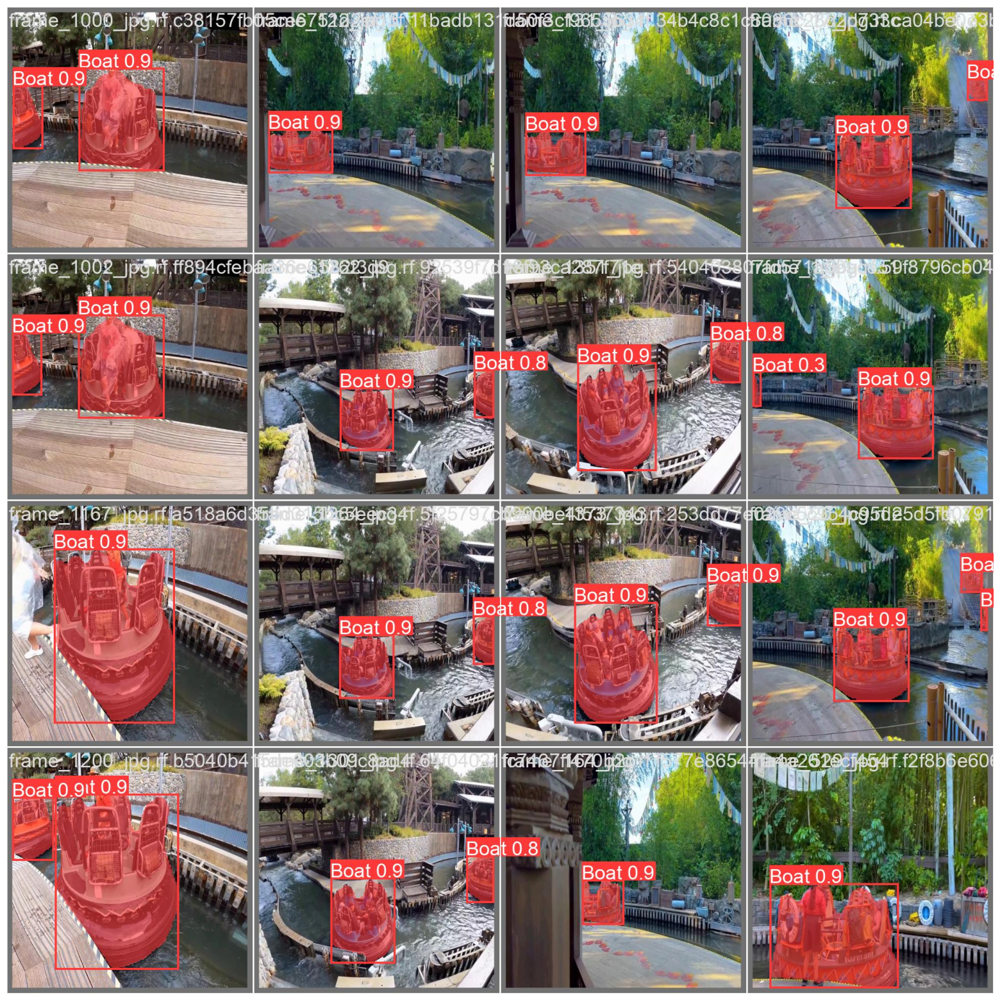

In [12]:
image_path = '/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_M/val_batch0_pred.jpg'
visualize_image(image_path)

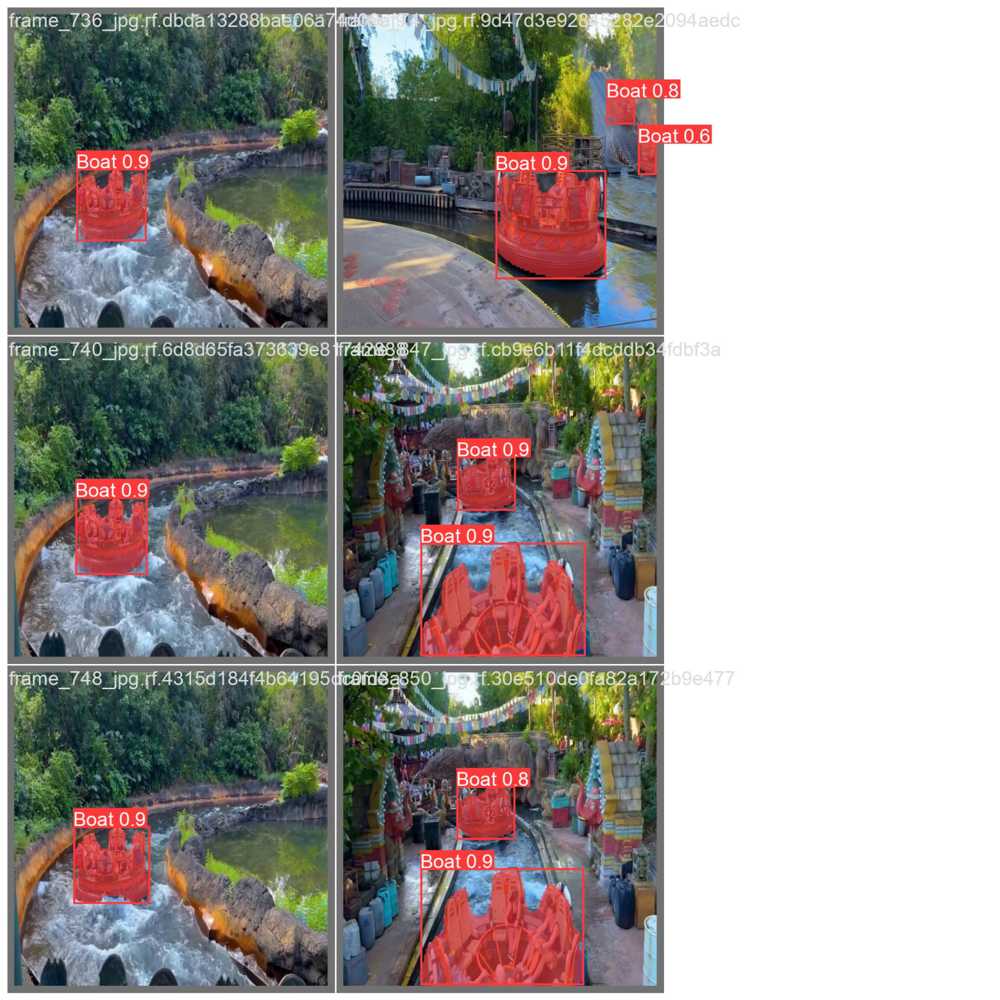

In [13]:
image_path = '/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_M/val_batch1_pred.jpg'
visualize_image(image_path)

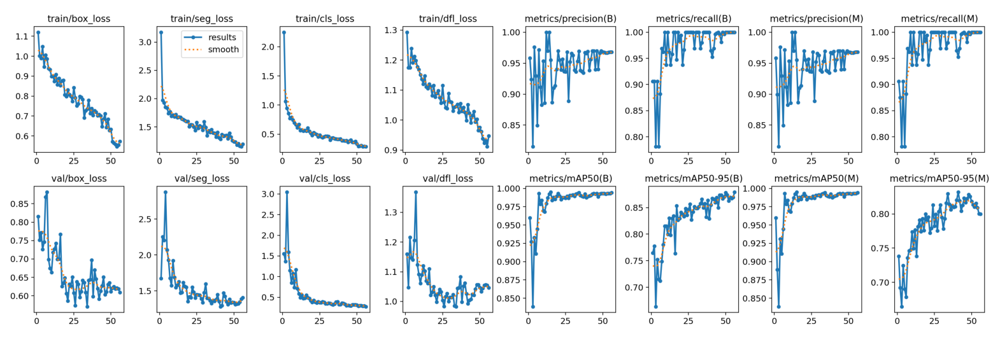

In [14]:
image_path = '/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_M/results.png'
visualize_image(image_path)

The Losses are looking pretty god

## Prediction on Video for testing how it performs

In [15]:
!yolo segment track model=/kaggle/working/Segmentation-2/runs/segment/Boat_Segmentation_M/weights/best.pt source='/kaggle/input/kali-test-2/kali_test_2.mp4'

requirements: Ultralytics requirement ['lapx>=0.5.2'] not found, attempting AutoUpdate...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 9.0 MB/s eta 0:00:00a 0:00:01

requirements: AutoUpdate success ✅ 11.8s, installed 1 package: ['lapx>=0.5.2']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect

Ultralytics YOLOv8.2.24 🚀 Python-3.10.13 torch-2.1.2 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-seg summary (fused): 245 layers, 27222963 parameters, 0 gradients, 110.0 GFLOPs

video 1/1 (frame 1/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 93.2ms
video 1/1 (frame 2/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 34.8ms
video 1/1 (frame 3/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 34.8ms
video 1/1 (frame 4/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 34.8ms
video 1/1 (frame 5/1018) /kaggle/input/kali-test-2/kali_test_2.mp4: 480x640 2 Boats, 34.3ms
video 1/1 (frame 6/1018) /kaggle/inpu

# Let's see how it performed

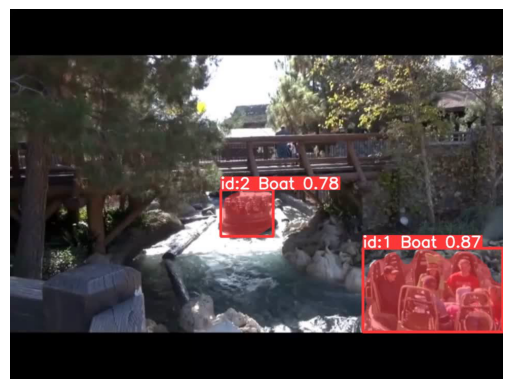

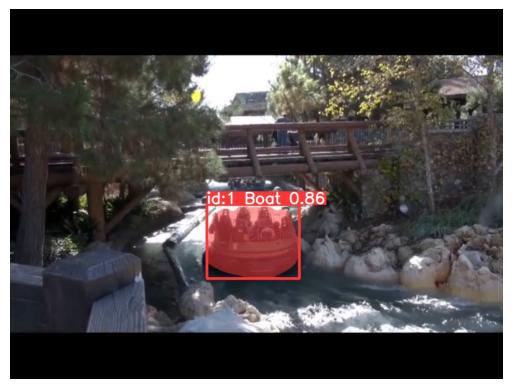

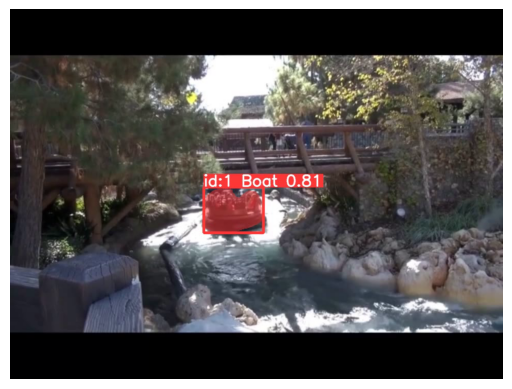

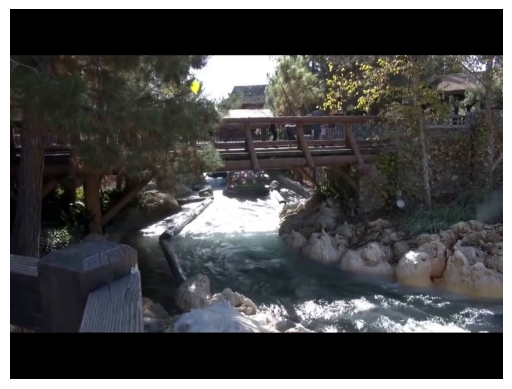

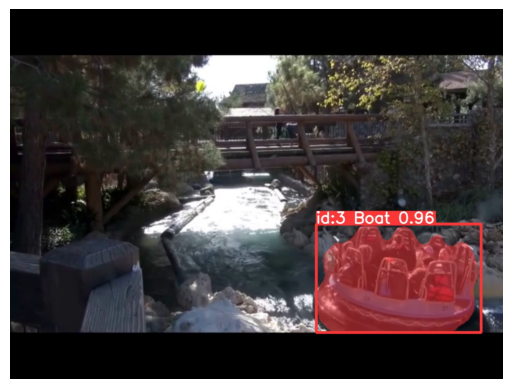

...

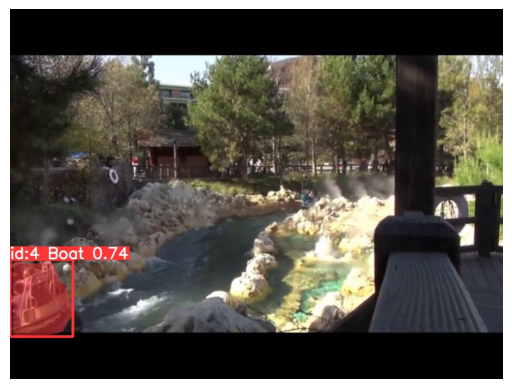

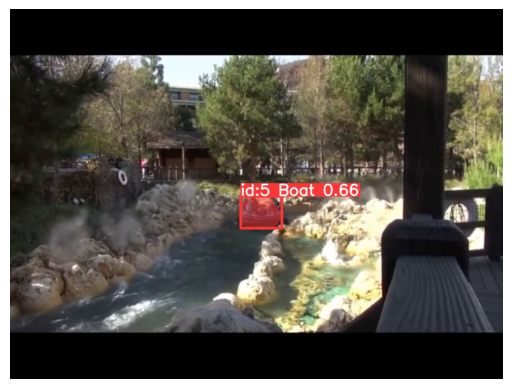

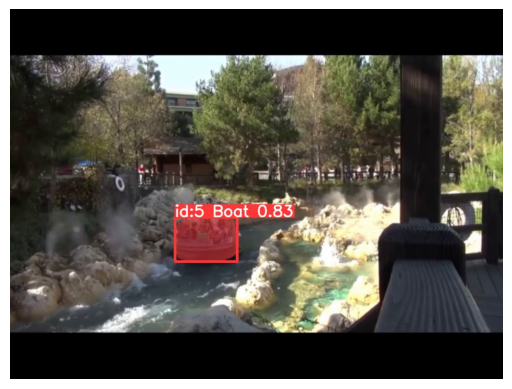

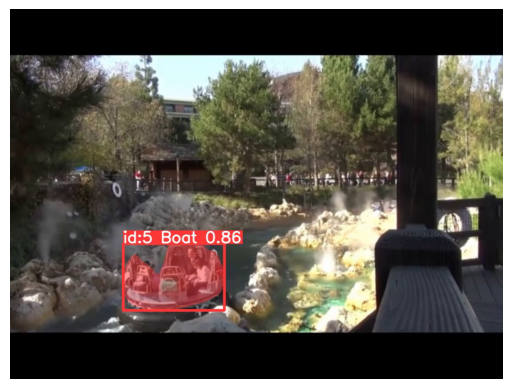

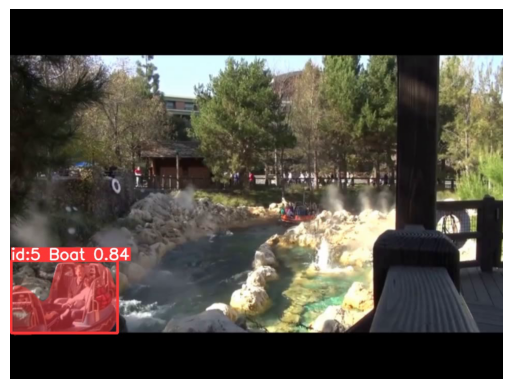

Failed to capture frame


In [16]:
import cv2
cap=cv2.VideoCapture('/kaggle/working/Segmentation-2/runs/segment/track/kali_test_2.avi')
count = 0

while True:
    ret, frame = cap.read()
    if not ret:
        print("Failed to capture frame")
        break
    if(count%100==0):  # show only 50th frame
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        plt.imshow(frame)
        plt.axis('off')
        plt.show()  
    count += 1

cap.release()

In [ ]:
import cv2
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
color = (0, 0, 0)
thickness = 2

In [ ]:
# Load the two videos
video1 = cv2.VideoCapture('/kaggle/working/Segmentation-2/runs/segment/track7/kali_test_2.avi')
video2 = cv2.VideoCapture('/kaggle/working/Segmentation-2/runs/segment/track6/kali_test_2.avi')

# Get the frame width and height of the first video
frame_width1 = int(video1.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height1 = int(video1.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Create a new video writer object to write the combined video
video_writer = cv2.VideoWriter('combined_video_yolo6.avi',cv2.VideoWriter_fourcc(*'XVID'), 30, (frame_width1*2, frame_height1))
while True:
    # Read the next frame from each video
    ret1, frame1 = video1.read()
    ret2, frame2 = video2.read()

    # If we reached the end of either video, break out of the loop
    if not ret1 or not ret2:
        break

    # Resize the frames to the same size
    frame1 = cv2.resize(frame1, (frame_width1, frame_height1))
    frame2 = cv2.resize(frame2, (frame_width1, frame_height1))
    
    # Add text to each frame
    cv2.putText(frame1, "Yolov8s Avgrage Inference 15ms", (50, 150), font, font_scale, color, thickness, cv2.LINE_AA)
    cv2.putText(frame2, "Yolov8m Avgrage Inference 20ms", (50,150), font, font_scale, color, thickness, cv2.LINE_AA)
     # Combine the two frames side by side
    combined_frame = cv2.hconcat([frame1, frame2])

    # Write the combined frame to the new video
    video_writer.write(combined_frame)

# Release the video capture and writer objects
video1.release()
video2.release()
video_writer.release()